Mini Project 2 : Kelompok 2

Classification of Dog Breeds Using CNN on the Standford Dog Dataset
1. Ihsan Ahmad Kamal
2. Andi Zhagyta Amalia Azrika
3. Tia Fiendi Aryaningtiyas


# Introduction
Image classification is a fundamental task in the field of computer vision. It involves assigning a label to an entire image or photograph. One popular approach to this task is to use Convolutional Neural Networks (CNNs), a type of deep learning model specifically designed for image processing.

The Stanford Dogs dataset is a popular dataset used in image classification tasks. It contains images of 120 breeds of dogs from around the world, with about 20,000 images in total. This dataset is a subset of the ImageNet dataset, but with more specific categories - in this case, dog breeds.

A Convolutional Neural Network (CNN) is a deep learning algorithm that can take in an input image, assign importance (learnable weights and biases) to various aspects/objects in the image, and be able to differentiate one from the other. The pre-processing required in a CNN is much lower as compared to other classification algorithms. While in primitive methods, filters are hand-engineered, with enough training, CNNs have the ability to learn these filters/characteristics.

The architecture of a CNN is designed to take advantage of the 2D structure of an input image (or other 2D input such as a speech signal). This is achieved with local connections and tied weights followed by some form of pooling which results in translation invariant features. Another benefit of CNNs is that they are easier to train and have many fewer parameters than fully connected networks with the same number of hidden units.

In the case of the Stanford Dogs dataset, a CNN can be trained to recognize different breeds of dogs. The network would likely learn to identify features that are unique to each breed, such as the shape and size of the dog, the type of fur, the shape of the ears, nose, and eyes, etc.

The process of training a CNN involves feeding the network a large number of labeled images, and using a process called backpropagation and an optimization technique (such as stochastic gradient descent) to adjust the weights and biases of the network in a way that minimizes the difference between the network’s predicted labels and the true labels.

Once the network is trained, it can be used to classify new, unseen images, making it a valuable tool for tasks such as automated image organization, image-based search, and even medical image analysis.

In conclusion, image classification with CNNs and the Stanford Dogs dataset is a powerful combination for developing and understanding deep learning models for visual recognition tasks. It provides a challenging problem space and a wealth of data for training and validating models. It’s a great starting point for anyone interested in diving into the world of image classification with deep learning.

So given this image:

![scottish-terrier](https://www.thesprucepets.com/thmb/EM59KmTcFa_x9ITsuaKTFXzDE0Y=/750x0/filters:no_upscale():max_bytes(150000):strip_icc():format(webp)/Scottishterrieroutside-5af801f8056a4a00a01b032a8da8eabf.jpg)

one should output Scottish Terrier

## Dataset

The task I'm interested in is image classification. Specifically, the [Stanford Dogs Dataset](http://vision.stanford.edu/aditya86/ImageNetDogs/). The data is given as a `tar`'d directory, where each image is stored as `Images/breed_i/dog_j.jpg`. Here the names `breed_i` and `dog_j` stand for the different breeds and image filenames, for example `Images/n02102318-cocker_spaniel/n02102318_10000.jpg` is this dog picture.

![An image of a Cocker Spaniel](https://fedelebron.com/static/cocker_spaniel.jpg)

The numbers in the filename mean nothing, there's only one `cocker_spaniel` directory, and the image filanemes don't correspond to anything in particular, they're just names of dog pictures.



Now we start by downloading the data and extract it

In [ ]:
!wget -nc http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
!tar -xf images.tar
!ls

--2024-05-18 16:33:53--  http://vision.stanford.edu/aditya86/ImageNetDogs/images.tar
Resolving vision.stanford.edu (vision.stanford.edu)... 171.64.68.10
Connecting to vision.stanford.edu (vision.stanford.edu)|171.64.68.10|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 793579520 (757M) [application/x-tar]
Saving to: ‘images.tar’

images.tar          100%[===================>] 756.82M  15.6MB/s    in 39s     

2024-05-18 16:34:32 (19.5 MB/s) - ‘images.tar’ saved [793579520/793579520]

Images	images.tar  sample_data


In [ ]:
# Import libraries
import os
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import seaborn as sns
import timeit
import cv2 as cv
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow import keras
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator
from keras.utils import plot_model
from keras import backend as K

from keras.models import load_model

from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import AveragePooling2D
from tensorflow.keras.layers import GlobalAveragePooling2D
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Activation
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense


#1. Image preprocessing¶
One of the modules required in this Notebook is to use transfer learning. A list of Keras applications and pre-trained models is available at: https://keras.io/api/applications/.

We will first select the model that we are going to use because the size of the images to use (and therefore the resizing to be carried out) will depend on it. We will select a model:

Powerful (with good Accuracy),
Small in size for material and logistical reasons,
With an average depth so as not to overload calculation times.
On these criteria, the Xception model seems suitable for our transfer learning: Size of 88 MB, Top-5 Accuracy at 0.945 and Depth at 126. The input images of this model will be 299px x 299px.

To begin, we will quickly analyze the data by looking in particular at the state of distribution of dog breeds in the images directory:

##1.1. Visualization of the list of breeds *(classes)* and example data.

In [ ]:
images_dir = './Images'

breed_list = os.listdir(images_dir)
print("Number of breeds in dataset:", (len(breed_list)))

Number of breeds in dataset: 120


120 dog breeds are therefore present in our dataset, which represents 120 classes for our classifier. We will now count the number of images of each race to check if the distribution is fair between classes:

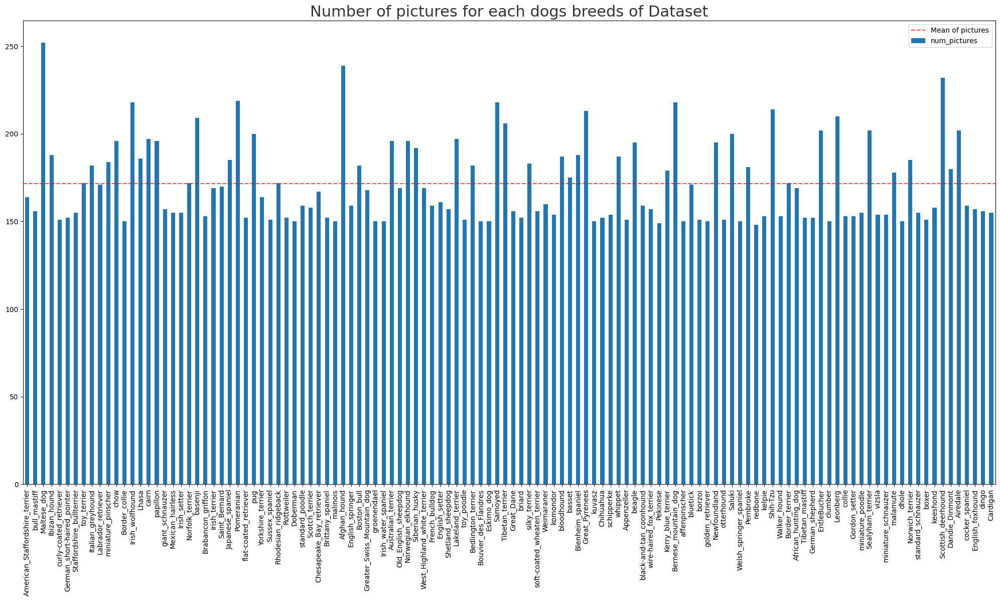

In [ ]:
# Count number of pictures for each breed
df_breeds = pd.DataFrame(
    index=[breed.split('-',1)[1]
           for breed in breed_list],
    data=[len(os.listdir(images_dir + "/" + name))
          for name in breed_list],
    columns=["num_pictures"])

# Plot results
fig, ax = plt.subplots(1, 1, figsize=(25,12))
df_breeds.plot(kind="bar",
               legend=False,
               ax=ax)
ax.axhline(df_breeds["num_pictures"].mean(),
           color='r', alpha=.7,
           linestyle='--',
           label="Mean of pictures")
plt.title("Number of pictures for each "\
          "dogs breeds of Dataset",
          color="#343434", fontsize=22)
plt.legend()
plt.show()

We notice that the dog breeds are all well supplied with images. The average is 171 photos per class. No breed is underrepresented so we can keep them all for the moment.

Let's look at some examples of photos by breed available in the study database:

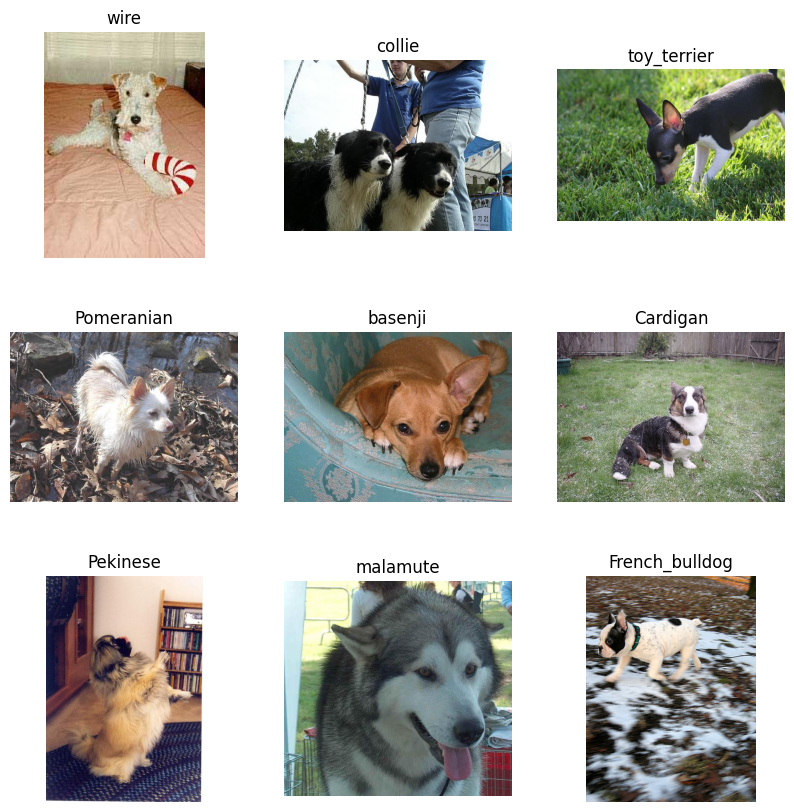

In [ ]:
# Get list of all the subdirectories
subdirs = [os.path.join(images_dir, d) for d in os.listdir(images_dir) if os.path.isdir(os.path.join(images_dir, d))]

# Randomly select a few subdirectories (classes)
selected_subdirs = random.sample(subdirs, 9)

# Display the images
plt.figure(figsize=(10, 10))
for i, subdir in enumerate(selected_subdirs):
    # Get a random image file from this directory
    image_file = random.choice(os.listdir(subdir))
    image_path = os.path.join(subdir, image_file)

    # Open and display the image
    img = cv.imread(image_path)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)  # Convert from BGR to RGB
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)

    # Extract the breed name from the directory name
    breed_name = os.path.basename(subdir).split('-')[1]  # The breed name is after the '-'
    plt.title(breed_name)

    plt.axis('off')
plt.show()


## 1.2. Pre-Proccess Dataset
We can notice in the example images above that the dogs present in the photos are not always in the center of the photo, that the zooms are different. Resizing the images will not change these attributes, the image will even be distorted to fit the new dimensions.

We will perform the transformation on a test image to start.

In [ ]:
img_test = (images_dir
            + "/"
            + "n02097047-miniature_schnauzer/n02097047_1093.jpg")
img_test = cv.imread(img_test)

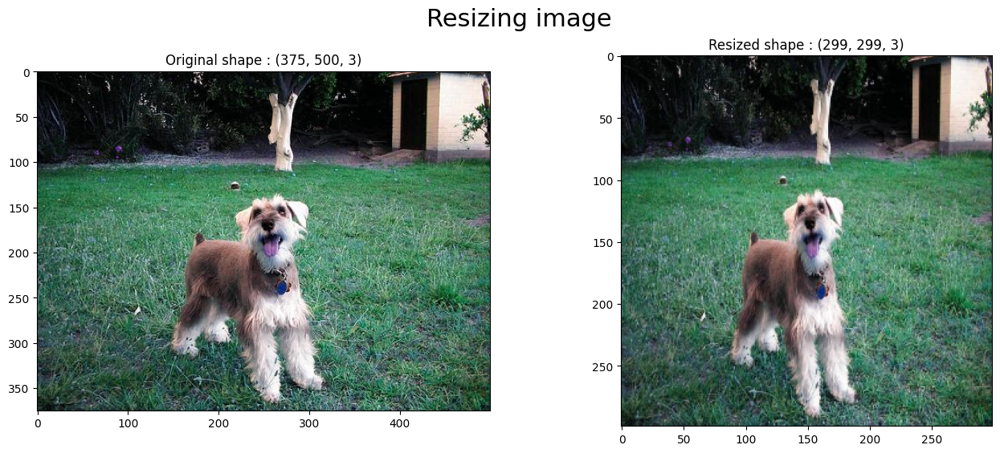

In [ ]:
# setting dim of the resize
height = 299
width = 299
dim = (width, height)
# resize image with OpenCV
res_img = cv.resize(img_test, dim, interpolation=cv.INTER_LINEAR)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_test)
plt.title("Original shape : {}".format(img_test.shape))
plt.subplot(1, 2, 2)
plt.imshow(res_img)
plt.title("Resized shape : {}".format(res_img.shape))
plt.suptitle("Resizing image",
             color="black",
             fontsize=22, y=.98)
plt.show()

We can clearly see here that resizing to 299 x 299 distorts the initial photo. Once this filter is applied to all images, they will likely all be distorted.

Another fact, with a relatively large set of images, the exposures, contrast, etc. are relatively different for each photo. We will now use methods based on the histograms of these images to best pre-process this data.

#1.3. Editing the image histogram
The histogram of a digital image is a statistical curve representing the distribution of its pixels according to their intensity. Let's start by looking at one image in particular.

We will transform the image into different color codings. The YUV coding system is created from an RGB source. It is coded into three components: Y represents luminance (brightness information) while the other two (U and V) are chrominance data (color information). This format allows us to best visualize the histogram for the 3 dimensions:

In [ ]:
# Transform image with differents color sets
img_RGB = cv.cvtColor(img_test, cv.COLOR_BGR2RGB)
img_grayscale = cv.cvtColor(img_test, cv.COLOR_RGB2GRAY)
img_YUV = cv.cvtColor(img_test,cv.COLOR_BGR2YUV)

In [ ]:
# Create histogram
def plot_histogram(init_img, convert_img):
    """Function allowing to display the initial
    and converted images according to a certain
    colorimetric format as well as the histogram
    of the latter.

    Parameters
    -------------------------------------------
    init_img : list
        init_img[0] = Title of the init image
        init_img[1] = Init openCV image
    convert_img : list
        convert_img[0] = Title of the converted
        convert_img[1] = converted openCV image
    -------------------------------------------
    """
    hist, bins = np.histogram(
                    convert_img[1].flatten(),
                    256, [0,256])
    # Cumulative Distribution Function
    cdf = hist.cumsum()
    cdf_normalized = cdf * float(hist.max()) / cdf.max()

    # Plot histogram
    fig = plt.figure(figsize=(25,6))
    plt.subplot(1, 3, 1)
    plt.imshow(init_img[1])
    plt.title("{} Image".format(init_img[0]),
              color="#343434")
    plt.subplot(1, 3, 2)
    plt.imshow(convert_img[1])
    plt.title("{} Image".format(convert_img[0]),
              color="#343434")
    plt.subplot(1, 3, 3)
    plt.plot(cdf_normalized,
             color='r', alpha=.7,
             linestyle='--')
    plt.hist(convert_img[1].flatten(),256,[0,256])
    plt.xlim([0,256])
    plt.legend(('cdf','histogram'), loc = 'upper left')
    plt.title("Histogram of convert image", color="#343434")
    plt.suptitle("Histogram and cumulative "\
                 "distribution for test image",
              color="black", fontsize=22, y=.98)
    plt.show()

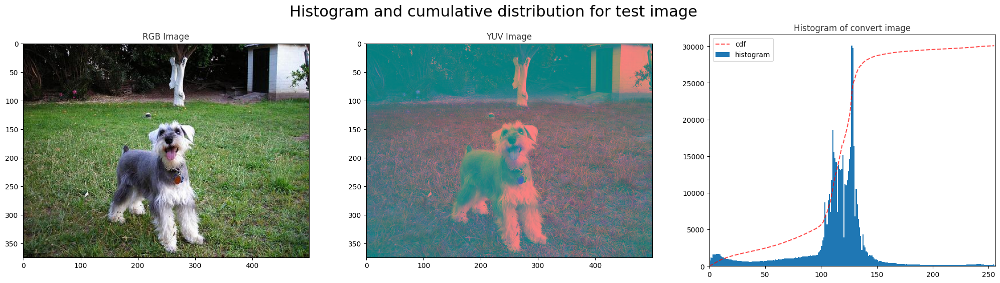

In [ ]:
plot_histogram(["RGB", img_RGB], ["YUV", img_YUV])

##Equalization
Here we see significant peaks in the center of the histogram. As part of good equalization (contrast improvement), it is necessary to distribute light across the entire spectrum of the image.

##Let's test the equalization with OpenCV:
The advantage of converting the image into the YUV color space is to be able to act on the “luminance” channel (Y) independently of the other chrominance channels. We will therefore carry out the equalization on this single Y channel:

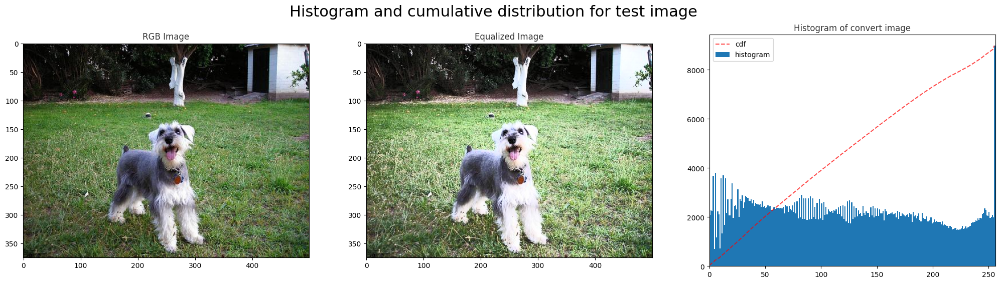

In [ ]:
# Equalization
img_YUV[:,:,0] = cv.equalizeHist(img_YUV[:,:,0])
img_equ = cv.cvtColor(img_YUV, cv.COLOR_YUV2RGB)
plot_histogram(["RGB", img_RGB], ["Equalized", img_equ])

The resulting image is therefore well equalized, the histogram covers the entire spectrum and the CDF is constant and linear. This pre-processing will therefore be applied to all of the images.

#1.4. Applying filters
Images can be noisy for many reasons, i.e. contain atypical pixels which can distort feature detection. For example of causes of noise:

* Camera Features,
* Compressing JPEG images
* Bad resolution.

To compensate for the noise present in the images, it is possible to apply a filter. There are several types: linear filters (like the Gaussian filter), non-linear filters like the median filter for example.
one of the best filters for denoising the image is the non-local means filter.

##Non-local means filter
Unlike "local average" filters, which take the average value of a group of pixels surrounding a target pixel to smooth the image, nonlocal average filtering takes an average of all pixels in the image, weighted by the similarity of these pixels with the target pixel. This results in much greater post-filtering clarity and less loss of detail in the image compared to local averaging algorithms.

Let's test this filter on our test image:

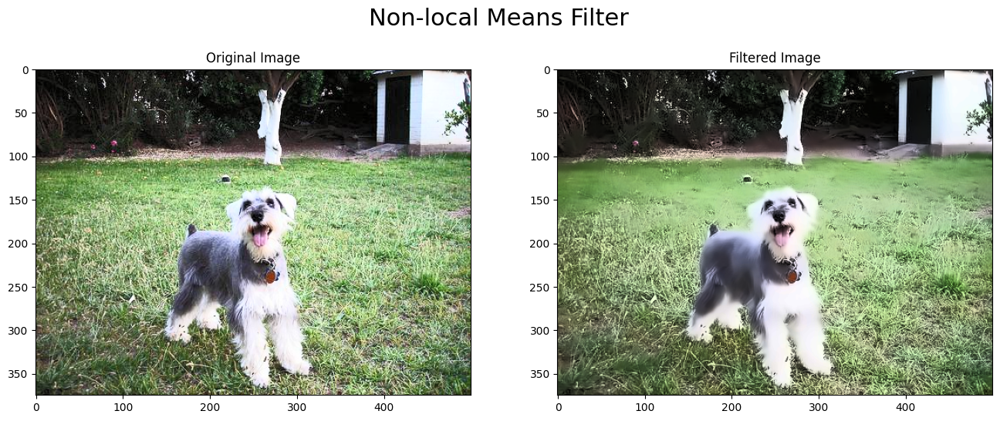

In [ ]:
# Apply non-local means filter on test img
dst_img = cv.fastNlMeansDenoisingColored(
    src=img_equ,
    dst=None,
    h=10,
    hColor=10,
    templateWindowSize=7,
    searchWindowSize=21)

# Show both img
fig = plt.figure(figsize=(16,6))
plt.subplot(1, 2, 1)
plt.imshow(img_equ)
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(dst_img)
plt.title("Filtered Image")
plt.suptitle("Non-local Means Filter",
             color="black",
             fontsize=22, y=.98)
plt.show()

#1.5. Data augmentation
The risk with this type of dataset with little data (20,000 images) is to overtrain our model; it will not be able to develop decision rules that can be generalized to new data. We must therefore increase the number of data and for this, we will use Data Augmentation.

The objective of data augmentation is to reproduce pre-existing images by applying a random transformation to them. For this, Keras provides the ImageDataGenerator method which allows you to do mirroring, rotation, zooming... and this randomly!

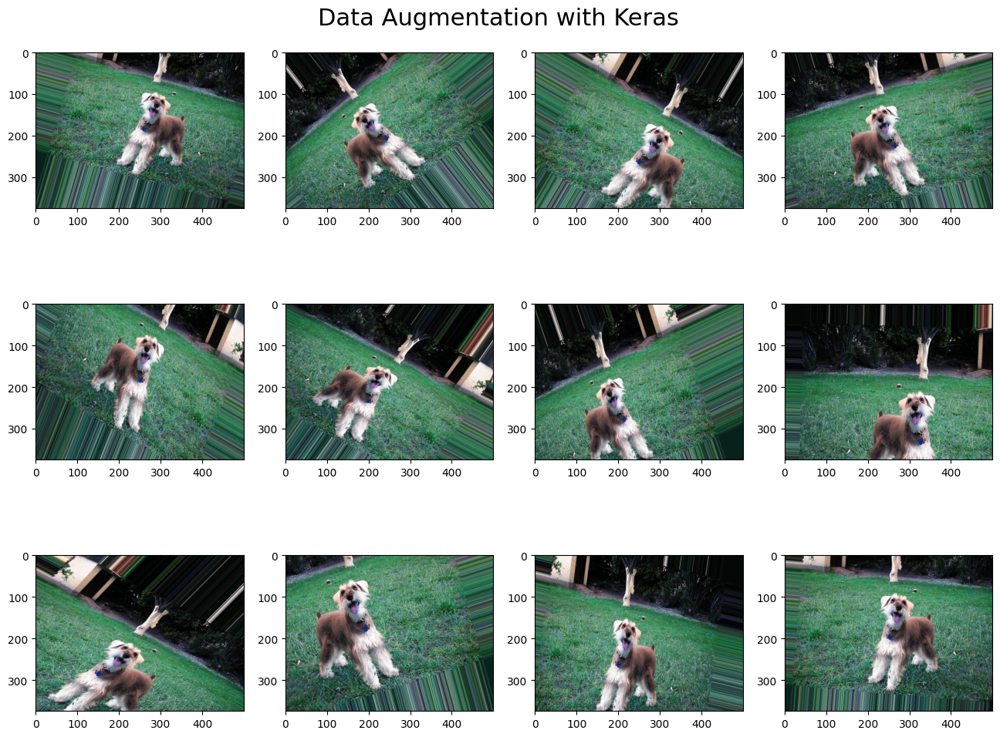

In [ ]:
#Initilize Data Generator Keras
augmented_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest')

# Convert test img to array
x = image.img_to_array(img_test)
x = x.reshape((1,) + x.shape)

i=0
fig = plt.figure(figsize=(16,12))
for batch in augmented_datagen.flow(x, batch_size=1):
    ax = fig.add_subplot(3,4,i+1)
    ax.imshow(image.array_to_img(batch[0]))
    i += 1
    if i % 12 == 0:
        break

plt.suptitle("Data Augmentation with Keras",
             color="black",
             fontsize=22, y=.90)
plt.show()

The Data Augmentation method allows us to obtain images with different zooms, mirror effects and rotations which will therefore increase our image base significantly and effectively.

#1.6. Batch function for preprocessing
We will already test the functions and the classification on a limited number of dog breeds in order to limit calculation times. Let's build the preprocessing function which will return the labels and images:

In [ ]:
def preprocessing_cnn(directories, img_width, img_height):
    """Preprocessing of images in order to integrate them
    into a convolutional neural network. Equalization,
    Denoising and transformation of the image into Array.
    Simultaneous creation of labels (y).

    Parameters
    ---------------------------------------------------
    directoriesList : list
        List of files to be processed.
    img_width : integer
        width of the image to be reached for resizing
    img_height : integer
        height of the image to be reached for resizing
    ---------------------------------------------------
    """
    img_list=[]
    labels=[]
    for index, breed in enumerate(directories):
        for image_name in os.listdir(images_dir+"/"+breed):
            # Read image
            img = cv.imread(images_dir+"/"+breed+"/"+image_name)
            img = cv.cvtColor(img,cv.COLOR_BGR2RGB)
            # Resize image
            dim = (img_width, img_height)
            img = cv.resize(img, dim, interpolation=cv.INTER_LINEAR)
            # Equalization
            img_yuv = cv.cvtColor(img,cv.COLOR_BGR2YUV)
            img_yuv[:,:,0] = cv.equalizeHist(img_yuv[:,:,0])
            img_equ = cv.cvtColor(img_yuv, cv.COLOR_YUV2RGB)
            # Apply non-local means filter on test img
            dst_img = cv.fastNlMeansDenoisingColored(
                src=img_equ,
                dst=None,
                h=10,
                hColor=10,
                templateWindowSize=7,
                searchWindowSize=21)

            # Convert modified img to array
            img_array = image.img_to_array(dst_img)

            # Append lists of labels and images
            img_list.append(np.array(img_array))
            labels.append(breed.split("-")[1])

    return img_list, labels

In [ ]:
# Get list of all the subdirectories
subdirs = [d for d in os.listdir(images_dir) if os.path.isdir(os.path.join(images_dir, d))]

# Randomly select 10 subdirectories
random_breeds = random.sample(subdirs, 10)

# Print the selected subdirectories
print(random_breeds)


['n02106030-collie', 'n02091635-otterhound', 'n02105056-groenendael', 'n02093754-Border_terrier', 'n02107683-Bernese_mountain_dog', 'n02097047-miniature_schnauzer', 'n02095314-wire-haired_fox_terrier', 'n02111500-Great_Pyrenees', 'n02110627-affenpinscher', 'n02111129-Leonberg']


In [ ]:
# Define numbers of breeds to preprocess
num_breeds = len(random_breeds)

# X = images
# y = labels
X, y = preprocessing_cnn(random_breeds, 299, 299)
# Convert in numpy array
X = np.array(X)
y = np.array(y)

print("Number of images preprocessed : {}"\
     .format(len(y)))
print("Shape of images np.array : {}"\
     .format(X.shape))

Number of images preprocessed : 1728
Shape of images np.array : (1728, 299, 299, 3)


#2. CNN model from scratch
Now, our test images have been pre-processed including equalization, denoising and resizing. We created lists of Numpy tables grouping images in digital format.
To train our first model, we must first mix the images because currently, all the photos of the same race follow one another.

##2.1. Preparing data for the CNN model
We will therefore mix the data in X and y for the first pass through the network. This mixing aims to reduce the variance and ensure that the models are not over-trained.

In [ ]:
# Using np.shuffle
img_space = np.arange(X.shape[0])
np.random.seed(8)
# Shuffle the space
np.random.shuffle(img_space)
# Apply to X and y in same order
X = X[img_space]
y = y[img_space]

The images are now mixed. For Keras modeling, we must also modify the types of our data X and convert our data to be predicted (y) into a numerical variable. Indeed, for the moment, it is textual data which is stored in y. So we'll use a simple LabelEncoder to convert them.

In [ ]:
# Change X type
X = X.astype(np.float32)
# Encode y text data in numeric
encoder = LabelEncoder()
encoder.fit(y)
y = encoder.transform(y)

In [ ]:
# Verifie encoder created classes
print(encoder.classes_)

['Bernese_mountain_dog' 'Border_terrier' 'Great_Pyrenees' 'Leonberg'
 'affenpinscher' 'collie' 'groenendael' 'miniature_schnauzer' 'otterhound'
 'wire']


Now we can create the training and test sets that will be used to train our models. The validation set will be created directly in the Keras generator.

In [ ]:
### Create train and test set
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

print("-" * 50)
print("Size of created sets :")
print("-" * 50)
print("Train set size = ",x_train.shape[0])
print("Test set size = ",x_test.shape[0])

--------------------------------------------------
Size of created sets :
--------------------------------------------------
Train set size =  1382
Test set size =  346


Last step of the preparation, we will create the Keras generators for the data sets including the Data Augmentation for the training set:

In [ ]:
# Data generator on train set with Data Augmentation
# Validation set is define here
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(rescale=1./255)

These generators will thus be used in the Keras modeling pipeline.

##2.2. Construction of the CNN model¶
Here we will initialize a first convolutional neural network model by nesting several layers:

* Convolution layers: Its goal is to identify the presence of a set of features in the images received as input. To do this, we carry out convolution filtering.
* Pooling Layers: The pooling operation consists of reducing the size of images, while preserving their important characteristics.
ReLU correction layers: The ReLU correction layer replaces all negative values ​​received as inputs with zeros. It plays the role of activation function.
* Fully connected layers: This type of layer receives a vector as input and produces a new vector as output. To do this, it applies a linear combination then possibly an activation function to the values ​​received as input.
* DropOut: The dropout method consists of “deactivating” neuron outputs randomly to avoid overtraining.
For our model, we are going to test a simple architecture, not too deep which will serve as a baseline for nearby models. We will therefore only implement 3 convolution layers.

We will also define more precise metrics than Accuracy for the evaluation of our model, such as the F1 Score which combines precision and recall:

In [ ]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

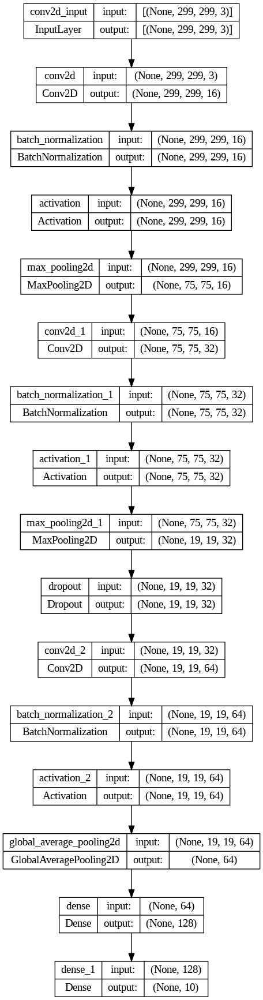

In [ ]:
K.clear_session()
model = Sequential()
# Convolution layer
model.add(Conv2D(filters=16,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False,
                 input_shape=(299,299,3)))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
# Pooling layer
model.add(MaxPooling2D(pool_size=(4, 4),
                       strides=(4, 4),
                       padding='same'))
# Second convolution layer
model.add(Conv2D(filters=32,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(4, 4), strides=(4, 4), padding='same'))
model.add(Dropout(0.2))
# Third convolution layer
model.add(Conv2D(filters=64,
                 kernel_size=(3,3),
                 padding='same',
                 use_bias=False))
model.add(BatchNormalization(axis=3, scale=False))
model.add(Activation('relu'))
model.add(GlobalAveragePooling2D())
# Fully connected layers
model.add(Dense(128, activation='relu'))
model.add(Dense(num_breeds, activation='softmax'))
plot_model(model, to_file='CNN_model_plot.png',
           show_shapes=True, show_layer_names=True)

In [ ]:
# Compile the CNN Model
model.compile(optimizer="adam",
              loss="sparse_categorical_crossentropy",
              metrics=["accuracy", f1_m])

Our model is created, we will be able to train it over 50 epochs using the previously created generators and store the results to then analyze them:

##2.3. Training and evaluation of the CNN model

In [ ]:
history = model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
43/43 - 30s - loss: 2.2722 - accuracy: 0.1562 - f1_m: 7.6469 - val_loss: 2.3086 - val_accuracy: 0.1341 - val_f1_m: 9.2041 - 30s/epoch - 687ms/step
Epoch 2/20
43/43 - 23s - loss: 2.1797 - accuracy: 0.2174 - f1_m: 7.5757 - val_loss: 2.3398 - val_accuracy: 0.0761 - val_f1_m: 8.5565 - 23s/epoch - 530ms/step
Epoch 3/20
43/43 - 23s - loss: 2.1233 - accuracy: 0.2159 - f1_m: 7.7892 - val_loss: 2.3441 - val_accuracy: 0.1196 - val_f1_m: 8.4584 - 23s/epoch - 539ms/step
Epoch 4/20
43/43 - 21s - loss: 2.0855 - accuracy: 0.2386 - f1_m: 7.1355 - val_loss: 2.4366 - val_accuracy: 0.0797 - val_f1_m: 7.2432 - 21s/epoch - 493ms/step
Epoch 5/20
43/43 - 23s - loss: 2.0575 - accuracy: 0.2599 - f1_m: 6.9444 - val_loss: 2.3762 - val_accuracy: 0.1196 - val_f1_m: 7.3308 - 23s/epoch - 529ms/step
Epoch 6/20
43/43 - 21s - loss: 2.0373 - accuracy: 0.2725 - f1_m: 6.9110 - val_loss: 2.3194 - val_accuracy: 0.1486 - val_f1_m: 7.7762 - 21s/epoch - 482ms/step
Epoch 7/20
43/43 - 23s - loss: 1.9716 - accuracy: 0.

In [ ]:
def plot_history_scores(dict_history, first_score, second_score):
    with plt.style.context('seaborn-whitegrid'):
        fig = plt.figure(figsize=(25,10))
        # summarize history for accuracy
        plt.subplot(1, 2, 1)
        plt.plot(dict_history.history[first_score], color="g")
        plt.plot(dict_history.history['val_' + first_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + first_score, fontsize=18)
        plt.ylabel(first_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        # summarize history for loss
        plt.subplot(1, 2, 2)
        plt.plot(dict_history.history[second_score], color="g")
        plt.plot(dict_history.history['val_' + second_score],
                 linestyle='--', color="orange")
        plt.title('CNN model ' + second_score, fontsize=18)
        plt.ylabel(second_score)
        plt.xlabel('epoch')
        plt.legend(['train', 'validation'], loc='upper left')
        plt.show()

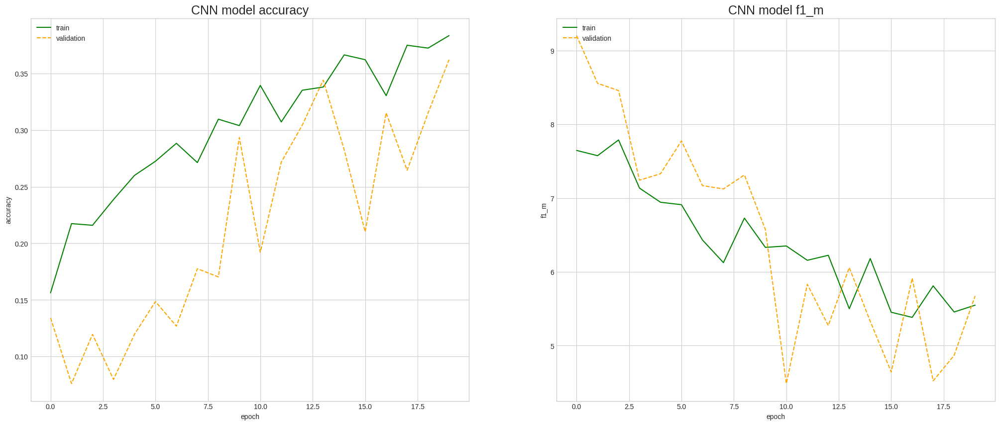

In [ ]:
plot_history_scores(
    dict_history = history,
    first_score = "accuracy",
    second_score = "f1_m")

We see that on this CNN from scratch model the metrics are not good. The Accuracy does not exceed 30% and the F1 score is high and stable over the 50 epochs.

We will now test pre-trained models and check if the performance is better compared to our baseline.

#3. Transfer Learning: Xception pre-trained CNN model
The Xception model is derived from the Inception architecture. Inception aims to reduce the resource consumption of deep CNNs. It is based on the use of the following processing blocks:

![inception_block](https://miro.medium.com/v2/resize:fit:828/format:webp/1*H_ZYfZ52t6M4UmML6a6pAQ.png)

The dimension of the analyzed image is reduced by the 3x3 and 5x5 filters, by adding a 1x1 filtering step upstream. In this way, the 1x1 size convolution performs a pooling operation on the values ​​of a pixel in the image dimension space.
Xception replaces Inception modules with depthwise separable convolution modules and adds residual links. This type of approach makes it possible to considerably reduce the use of resources during matrix calculation, without modifying the number of parameters.
To learn more: https://arxiv.org/abs/1610.02357

The Xception architecture is as follows:

![xception](https://maelfabien.github.io/assets/images/xception.jpg)

##3.1. Importing the pre-trained Xception model
Let's load the Keras pre-trained base model but without the fully-connected layers. We will add our own final classifier.

In [ ]:
K.clear_session()
# Import Xception trained model
xception_model = tf.keras.applications.xception.Xception(
    weights='imagenet',
    include_top=False,
    pooling='avg',
    input_shape=(299,299,3))

# look at the differents layers
print("-" * 50)
print("Xception base model layers :")
print("-" * 50)
for layer in xception_model.layers:
    print(layer)

83683744/83683744 [==============================] - 1s 0us/step
--------------------------------------------------
Xception base model layers :
--------------------------------------------------


##3.2. Training the new classifier on Xception
Our dataset is small and relatively similar to the original dataset. If we train the entire network, we risk encountering over-fitting problems. We will therefore "freeze" all the layers of Xception and only train it to classify it.

In [ ]:
for layer in xception_model.layers:
    layer.trainable = False

We notice in the layers imported from the model that the last layer imported is a GlobalAveragePooling2D layer. We will therefore add a fully connected layer, a DropOut and finally classify it in a new model: # 1. Preprocessing of images

In [ ]:
# Add new fully-connected layers
base_output = xception_model.output
base_output = Dense(128, activation='relu')(base_output)
base_output = Dropout(0.2)(base_output)
# Output : new classifier
predictions = Dense(num_breeds, activation='softmax')(base_output)

# Define new model
my_xcept_model = Model(inputs=xception_model.input,
                       outputs=predictions)
my_xcept_model.compile(optimizer="adam",
                       loss="sparse_categorical_crossentropy",
                       metrics=["accuracy", f1_m])

In [ ]:
Xception_plot = plot_model(my_xcept_model,
                           to_file='xcept_model_plot.png',
                           show_shapes=True,
                           show_layer_names=False)

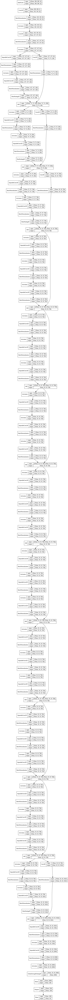

In [ ]:
Xception_plot

It is also necessary to modify the generators to integrate the Xception preprocess_input recommended by Keras:

In [ ]:
# Data generator on train set with Data Augmentation
# and preprocess_input Xception
# Validation set is define here
train_datagen = ImageDataGenerator(
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest',
    validation_split=0.2,
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

#For validation and test, just rescale
test_datagen = ImageDataGenerator(
    preprocessing_function=tf.keras.applications.xception.preprocess_input)

In [ ]:
history_xcept = my_xcept_model.fit(
    train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='training'),
    validation_data=train_datagen.flow(
        x_train, y_train,
        batch_size=16,
        subset='validation'),
    steps_per_epoch=len(x_train) / 32,
    epochs=20,
    verbose=2)

Epoch 1/20
43/43 - 35s - loss: 1.3412 - accuracy: 0.6130 - f1_m: 3.9819 - val_loss: 0.8582 - val_accuracy: 0.7536 - val_f1_m: 2.2062 - 35s/epoch - 813ms/step
Epoch 2/20
43/43 - 25s - loss: 0.7235 - accuracy: 0.7756 - f1_m: 1.9849 - val_loss: 0.6335 - val_accuracy: 0.7826 - val_f1_m: 1.8812 - 25s/epoch - 578ms/step
Epoch 3/20
43/43 - 25s - loss: 0.4840 - accuracy: 0.8494 - f1_m: 1.6439 - val_loss: 0.5273 - val_accuracy: 0.8152 - val_f1_m: 1.4860 - 25s/epoch - 580ms/step
Epoch 4/20
43/43 - 27s - loss: 0.5180 - accuracy: 0.8139 - f1_m: 1.6040 - val_loss: 0.5245 - val_accuracy: 0.8551 - val_f1_m: 1.5620 - 27s/epoch - 627ms/step
Epoch 5/20
43/43 - 25s - loss: 0.4174 - accuracy: 0.8725 - f1_m: 1.5360 - val_loss: 0.4910 - val_accuracy: 0.8333 - val_f1_m: 1.4615 - 25s/epoch - 582ms/step
Epoch 6/20
43/43 - 24s - loss: 0.4130 - accuracy: 0.8580 - f1_m: 1.3674 - val_loss: 0.4830 - val_accuracy: 0.8442 - val_f1_m: 1.5168 - 24s/epoch - 566ms/step
Epoch 7/20
43/43 - 24s - loss: 0.3795 - accuracy: 0.

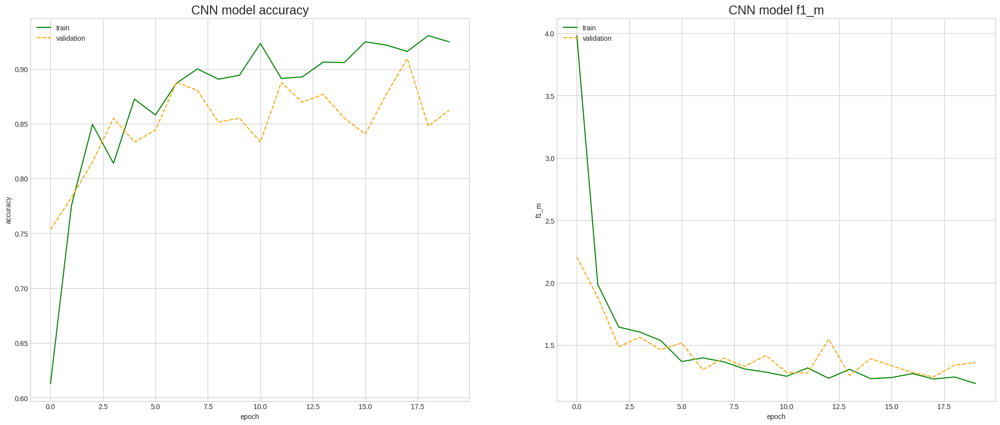

In [ ]:
plot_history_scores(
    dict_history = history_xcept,
    first_score = "accuracy",
    second_score = "f1_m")

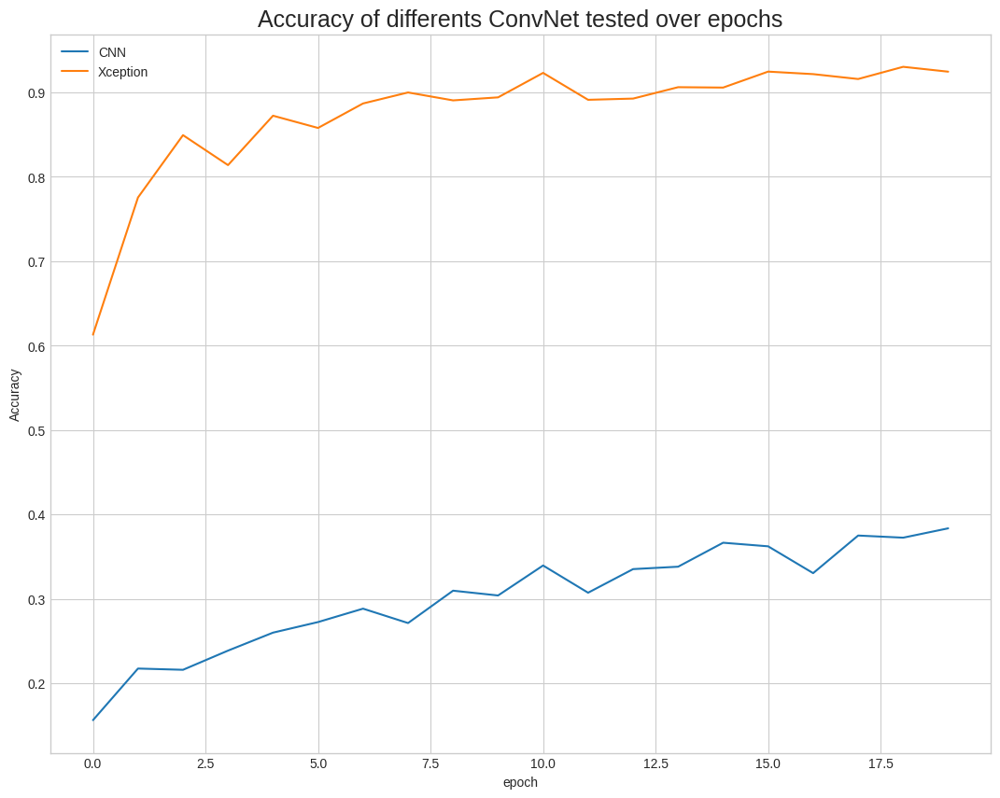

In [ ]:
with plt.style.context('seaborn-whitegrid'):
    plt.figure(figsize=(13,10))
    plt.plot(history.history['accuracy'],
             label='CNN')
    plt.plot(history_xcept.history['accuracy'],
             label='Xception')
    plt.title('Accuracy of differents ConvNet tested over epochs',
              fontsize=18)
    plt.ylabel('Accuracy')
    plt.xlabel('epoch')
    plt.legend(loc='upper left')
    plt.show()

In [ ]:
xcept_mean_accuracy = np.mean(history_xcept.history['val_accuracy'])
xcept_mean_f1 = np.mean(history_xcept.history['val_f1_m'])
print("-" * 50)
print("Xception base model validation Scores :")
print("-" * 50)
print("Mean validation accuracy: {:.2f}"\
      .format(xcept_mean_accuracy))
print("Mean validation F1 score: {:.2f}"\
      .format(xcept_mean_f1))

--------------------------------------------------
Xception base model validation Scores :
--------------------------------------------------
Mean validation accuracy: 0.85
Mean validation F1 score: 1.44


#4. Xception model evaluation on test data
We will evaluate this last model on the test data generated using the Keras ImageDataGenerator previously defined:

In [ ]:
# Model evaluation on test set
xception_eval = history_xcept.model.evaluate(
    test_datagen.flow(
        x_test, y_test,
        batch_size=16,
        shuffle=False),
    verbose=1)
print("-" * 50)
print("Xception model evaluation :")
print("-" * 50)
print('Test Loss: {:.3f}'.format(xception_eval[0]))
print('Test Accuracy: {:.3f}'.format(xception_eval[1]))
print('Test F1 score: {:.3f}'.format(xception_eval[2]))

22/22 [==============================] - 5s 245ms/step - loss: 0.2121 - accuracy: 0.9306 - f1_m: 1.1073
--------------------------------------------------
Xception model evaluation :
--------------------------------------------------
Test Loss: 0.212
Test Accuracy: 0.931
Test F1 score: 1.107


22/22 [==============================] - 3s 115ms/step


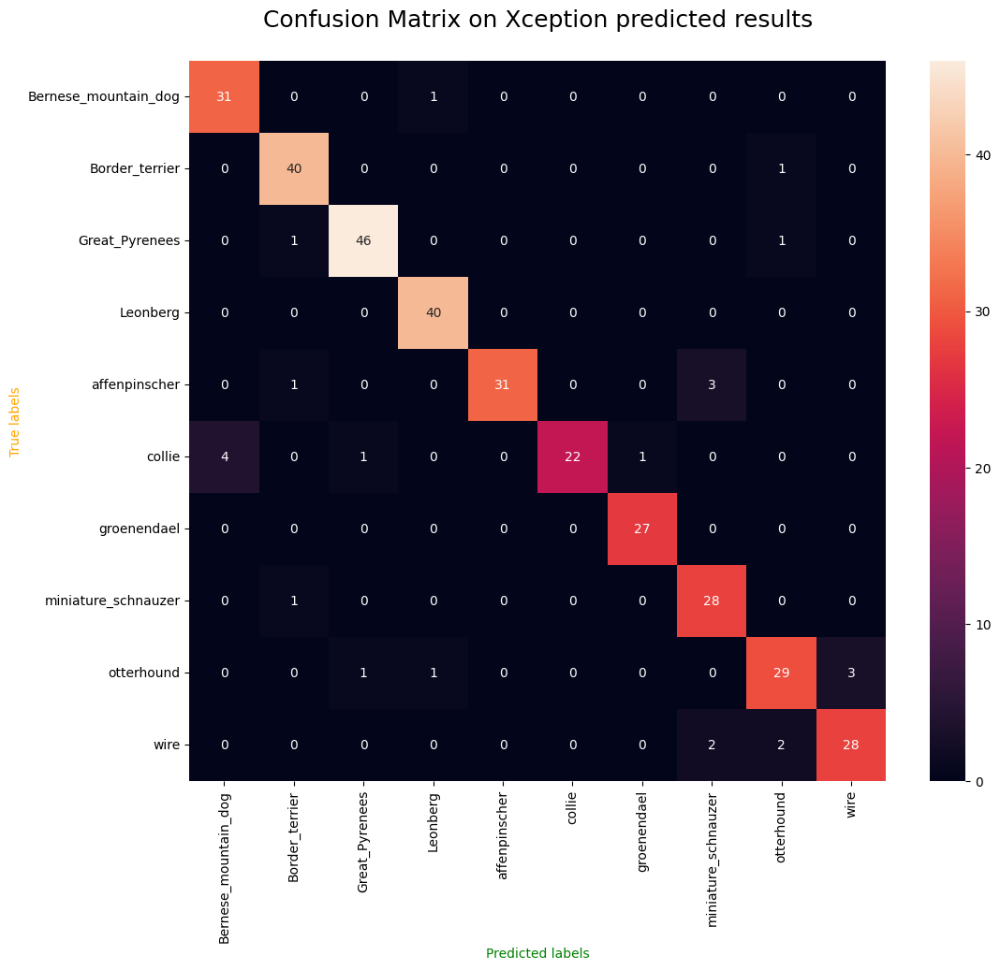

In [ ]:
# Make predictions
Y_pred = history_xcept.model.predict(
    test_datagen.flow(
        x_test, y_test,
        batch_size=16,
        shuffle=False))
y_pred = np.argmax(Y_pred, axis=1)

# Inverse transform of encoding
y_pred_s = encoder.inverse_transform(y_pred)
y_test_s = encoder.inverse_transform(y_test)

# Confusion Matrix
cf_matrix = confusion_matrix(y_test, y_pred)

fig = plt.figure(figsize=(12,10))
ax = sns.heatmap(cf_matrix, annot=True)
ax.set_xlabel("Predicted labels", color="g")
ax.set_ylabel("True labels", color="orange")
ax.xaxis.set_ticklabels(encoder.classes_,
                        rotation='vertical')
ax.yaxis.set_ticklabels(encoder.classes_,
                        rotation='horizontal')
plt.title("Confusion Matrix on Xception predicted results\n",
          fontsize=18)
plt.show()

In [ ]:
# Classification report
print(classification_report(
    y_test, y_pred,
    target_names=sorted(set(y_test_s))))

                      precision    recall  f1-score   support

Bernese_mountain_dog       0.89      0.97      0.93        32
      Border_terrier       0.93      0.98      0.95        41
      Great_Pyrenees       0.96      0.96      0.96        48
            Leonberg       0.95      1.00      0.98        40
       affenpinscher       1.00      0.89      0.94        35
              collie       1.00      0.79      0.88        28
         groenendael       0.96      1.00      0.98        27
 miniature_schnauzer       0.85      0.97      0.90        29
          otterhound       0.88      0.85      0.87        34
                wire       0.90      0.88      0.89        32

            accuracy                           0.93       346
           macro avg       0.93      0.93      0.93       346
        weighted avg       0.93      0.93      0.93       346



The confusion matrix and the classification report tell us that the results are satisfactory. Overall accuracy on the test set is 0.93 and the matrix clearly presents the majority predict / true couples diagonally. We will visualize some of these predictions with their labels:

<ipython-input-40-e55b9d6f1535>:11: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  r = int(np.random.randint(0, x_test.shape[0], 1))


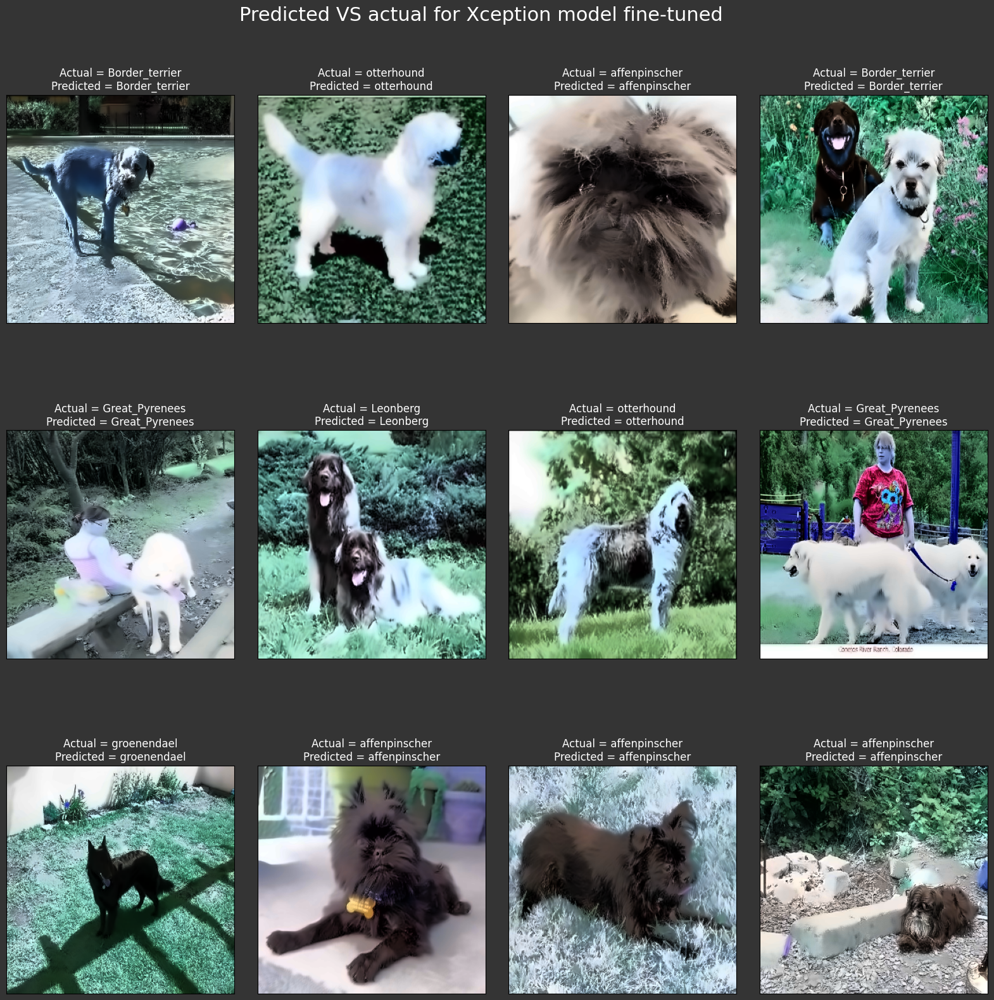

In [ ]:
fig = plt.figure(1, figsize=(20,20))
fig.patch.set_facecolor('#343434')
plt.suptitle("Predicted VS actual for Xception model fine-tuned",
             y=.92, fontsize=22,
             color="white")

n = 0

for i in range(12):
    n+=1
    r = int(np.random.randint(0, x_test.shape[0], 1))
    plt.subplot(3,4,n)
    plt.subplots_adjust(hspace = 0.1, wspace = 0.1)
    plt.imshow(image.array_to_img(x_test[r]))
    plt.title('Actual = {}\nPredicted = {}'.format(y_test_s[r] , y_pred_s[r]),
              color="white")
    plt.xticks([]) , plt.yticks([])

plt.show()

We can clearly see that the final predictions are good in most cases.